#### This notebook describes:

#### 1) How the plots describing the subsetted PF-ILD atlas were generated for supplementary figures 1-3

#### 2) How the dotplots showing cell type specific gene expression for genes used in plotting the Niches were generated

In [1]:
# data wrangling
import numpy as np
import pandas as pd
from itertools import cycle
from itertools import chain
import re
import os
import sys
import yaml
from collections import OrderedDict, Counter
from tqdm.auto import tqdm
import warnings
warnings.filterwarnings("ignore")
from IPython.core.display import display, HTML

In [2]:
# scverse packages
import scipy
import scvi
import scipy.sparse 
import scanpy as sc

Global seed set to 0


In [3]:
import torch
if torch.cuda.is_available():
    print('cuda is available')
else:
    print('cuda is not available')

cuda is not available


In [4]:
# plotting
from matplotlib import rcParams
import matplotlib.pyplot as plt
import seaborn as sns
import patchworklib as pw
#import plotnine as p9
%matplotlib inline
import plotly.graph_objects as go
from pylab import *
from IPython.core.display import display, HTML

<Figure size 72x72 with 0 Axes>

In [5]:
sc.settings.verbosity = 2  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures
sc.logging.print_header()

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==2.0.1 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.10


In [6]:
## frequently used variables
from matplotlib import colors
import matplotlib.pyplot as plt
colorsComb = np.vstack([plt.cm.Reds(np.linspace(0, 1, 128)), plt.cm.Greys_r(np.linspace(0.7, 0.8, 0))])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

## Along these Lines, a colourmap diverging from gray to red
gray_red = colors.LinearSegmentedColormap.from_list("grouping", ["lightgray", "red", "darkred"], N = 128)

## Some more Colour Maps
gray_violet = colors.LinearSegmentedColormap.from_list("grouping", ["lightgray", "mediumvioletred", "indigo"], N = 128)
gray_blue = colors.LinearSegmentedColormap.from_list("grouping", ["lightgray", "cornflowerblue", "darkblue"], N = 128)

sc.settings.figdir = "./figures/"

def mysize(w, h, d):
    fig, ax = plt.subplots(figsize = (w, h), dpi = d)
    return(fig.gca())
plt.rcParams['figure.figsize'] = (6, 6)
sc.set_figure_params(dpi=100, vector_friendly=True)

## Load 

In [18]:
adata = sc.read_h5ad(".h5ad")

In [19]:
adata

AnnData object with n_obs × n_vars = 206947 × 30647
    obs: 'sampleID', 'study', 'diagnosis', 'Disease_study', 'compartment', 'cell type', 'cell subtype', 'n_genes', 'log1p_n_genes_by_counts', 'total_counts', 'pct_counts_mitochondrial', 'Source', 'n_genes_by_counts', 'log1p_total_counts', 'total_counts_mitochondrial', 'log1p_total_counts_mitochondrial', 'cell_type_CM', 'cell_type_CM2'
    var: 'gene_ids', 'gene_name', 'mitochondrial', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'cell subtype_colors', 'cell type_colors', 'cell_type_CM2_colors', 'cell_type_CM_colors', 'compartment_colors', 'diagnosis_colors', 'neighbors', 'study_colors', 'umap'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts', 'log1p'
    obsp: 'connectivities', 'distances'

In [20]:
len(adata.obs.sampleID.unique())

122

In [21]:
adata.var_names = adata.var["gene_name"].tolist().copy()

In [22]:
adata.var_names

Index(['RP11-34P13.3', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.14',
       'RP11-34P13.9', 'RP4-669L17.2', 'RP5-857K21.2', 'RP11-206L10.4',
       'RP11-206L10.9',
       ...
       'AC007325.4', 'AC007325.2', 'BX072566.1', 'AL354822.1', 'AC023491.2',
       'AC004556.1', 'AC233755.2', 'AC233755.1', 'AC240274.1', 'FAM231B'],
      dtype='object', length=30647)

## plot

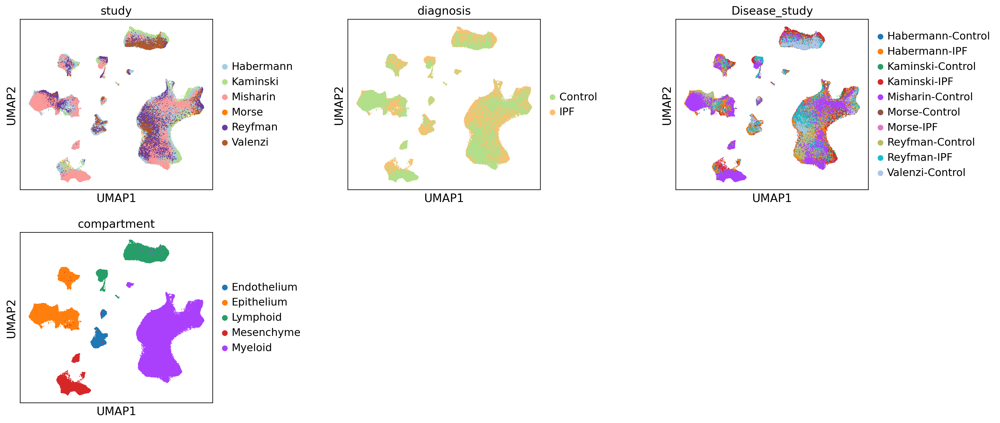

In [18]:
sc.pl.umap(adata,color = ['study', 'diagnosis', 'Disease_study', 'compartment',],legend_loc="right margin",ncols=3, cmap=mymap, size=5, wspace = 0.55,)

In [22]:
adata.uns["diagnosis_colors"] = ["#1F77B4FF", "#FF7F0EFF"]

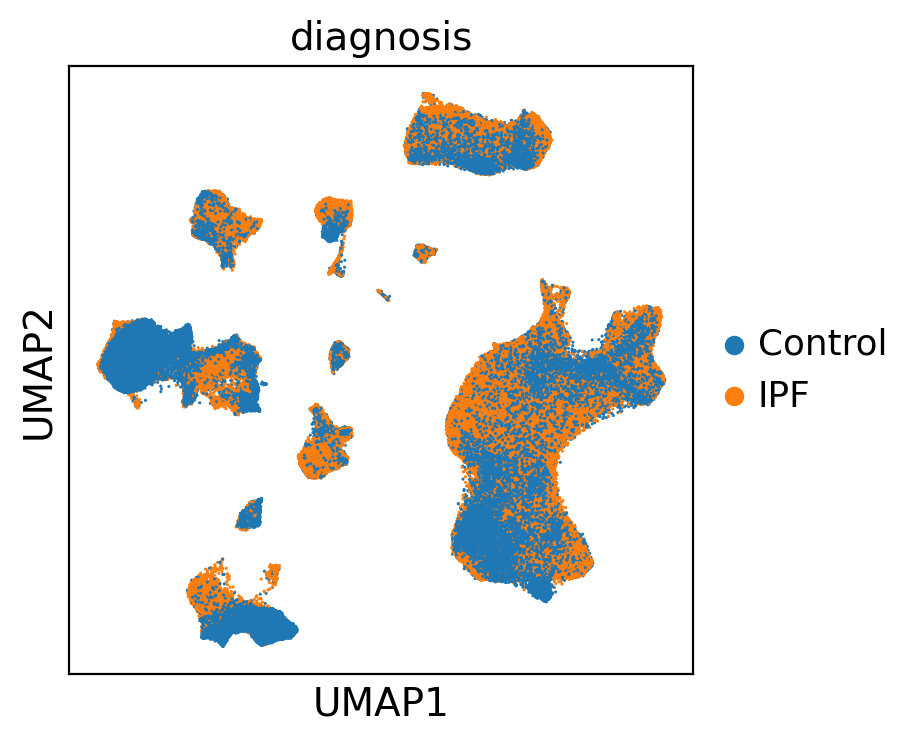

In [24]:
sc.pl.umap(adata,color = [ 'diagnosis',],legend_loc="right margin",ncols=3, cmap=mymap, size=5, wspace = 0.55,)

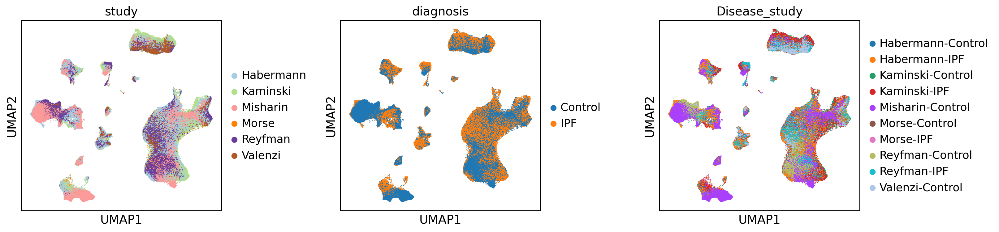

In [29]:
sc.pl.umap(adata,color = ['study', 'diagnosis', 'Disease_study', ],legend_loc="right margin",ncols=3, cmap=mymap, size=3, wspace = 0.45,save="ILDatlas_study_diagnosis.pdf")

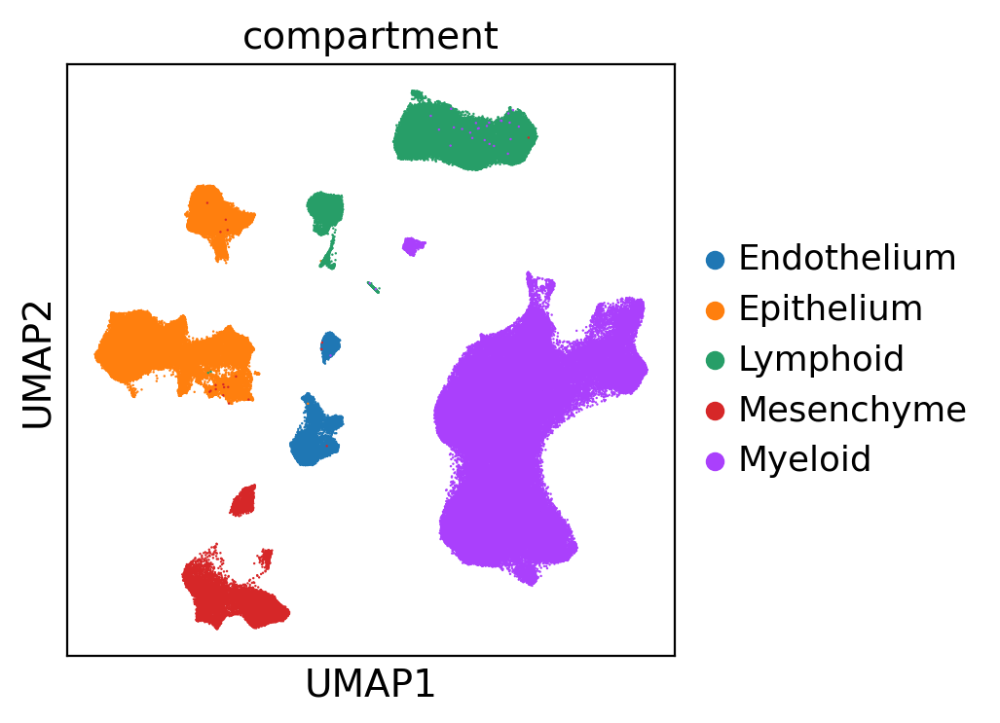

In [30]:
sc.pl.umap(adata,color = ["compartment"],legend_loc="right margin",ncols=3, cmap=mymap, size=3, wspace = 0.45,save="ILDatlas_compartment.pdf")

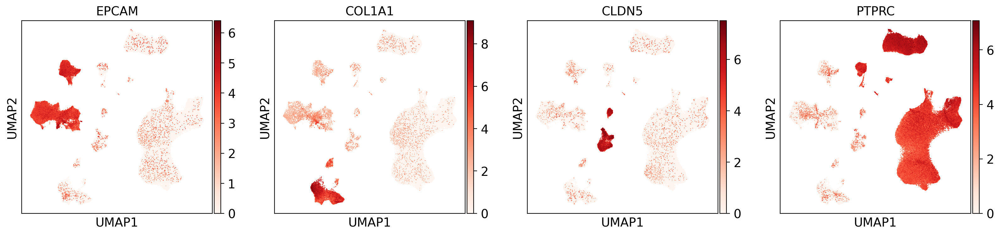

In [38]:
sc.pl.umap(adata,color = ["EPCAM","COL1A1","CLDN5","PTPRC"],legend_loc="right margin",ncols=4, cmap=mymap, size=3, save="ILDatlas_compartment_markers.pdf")

In [55]:
adata.obs['cell_type_CM2'] = adata.obs['cell_type_CM2'].cat.reorder_categories(['AT0', 'AT1', 'AT2', 'Aberrant basaloid', 'Adventitial fibroblast',
       'Alveolar fibroblast', 'Artery', 'B/Plasma', 'Basal', 'Basophil/Mast',
       'Bronchial Vessel', 'Capillary', 'Capillary Aerocyte', 'Ciliated',
       'Ciliated SFTPB+/SCGB1A1+', 'Dendritic', 'Ionocyte', 'Lymphatic',
       'Macrophage C1Q hi', 'Macrophage CHI3L1+/CD9 hi/', 'Macrophage FABP4+',
       'Macrophage IL1B+', 'Macrophage LYVE1+', 'Macrophage RETN+/VCAN+',
       'Mesothelial', 'Monocyte', 'Mucous', 'Myofibroblast', 'NK',
       'Peribronchial fibroblast', 'pDC','Pericyte', 'preTB-SC/RAS' ,'Smooth Muscle', 'T cell',
       'TB-SC', 'Vein'])

In [56]:
adata.obs['cell_type_CM2'].cat.categories

Index(['AT0', 'AT1', 'AT2', 'Aberrant basaloid', 'Adventitial fibroblast',
       'Alveolar fibroblast', 'Artery', 'B/Plasma', 'Basal', 'Basophil/Mast',
       'Bronchial Vessel', 'Capillary', 'Capillary Aerocyte', 'Ciliated',
       'Ciliated SFTPB+/SCGB1A1+', 'Dendritic', 'Ionocyte', 'Lymphatic',
       'Macrophage C1Q hi', 'Macrophage CHI3L1+/CD9 hi/', 'Macrophage FABP4+',
       'Macrophage IL1B+', 'Macrophage LYVE1+', 'Macrophage RETN+/VCAN+',
       'Mesothelial', 'Monocyte', 'Mucous', 'Myofibroblast', 'NK',
       'Peribronchial fibroblast', 'pDC', 'Pericyte', 'preTB-SC/RAS',
       'Smooth Muscle', 'T cell', 'TB-SC', 'Vein'],
      dtype='object')

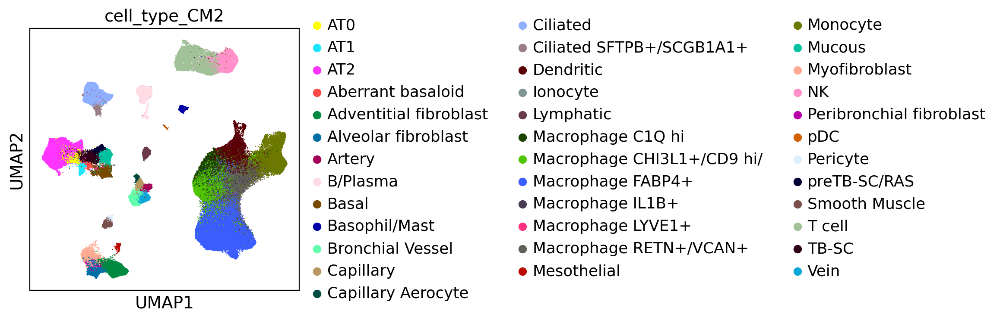

In [60]:
sc.pl.umap(adata,color = ["cell_type_CM2"],legend_loc="right margin",ncols=3, cmap=mymap, size=3, wspace = 0.45,save="ILDatlas_cell_type_CM2.pdf")

### Endothelium

In [58]:
adata.obs["compartment"].cat.categories

Index(['Endothelium', 'Epithelium', 'Lymphoid', 'Mesenchyme', 'Myeloid'], dtype='object')

In [68]:
Endothelium = adata[(adata.obs["compartment"] == "Endothelium")]
Endothelium

View of AnnData object with n_obs × n_vars = 12386 × 30647
    obs: 'sampleID', 'study', 'diagnosis', 'Disease_study', 'compartment', 'cell type', 'cell subtype', 'n_genes', 'log1p_n_genes_by_counts', 'total_counts', 'pct_counts_mitochondrial', 'Source', 'n_genes_by_counts', 'log1p_total_counts', 'total_counts_mitochondrial', 'log1p_total_counts_mitochondrial', 'cell_type_CM', 'cell_type_CM2'
    var: 'gene_ids', 'gene_name', 'mitochondrial', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'cell subtype_colors', 'cell type_colors', 'cell_type_CM2_colors', 'cell_type_CM_colors', 'compartment_colors', 'diagnosis_colors', 'neighbors', 'study_colors', 'umap', 'Disease_study_colors'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts', 'log1p'
    obsp: 'connectivities', 'distances'

In [69]:
## Remove outlying cells based on UMAP using DBScan
## Call with: sub.obs["d_cluster"] = tidy_up(sub.obsm["X_umap"], min_samples = 10)
def tidy_up(cords, eps = 1, min_samples = 2):
    from sklearn.cluster import DBSCAN
    from natsort import natsorted
    clustering = DBSCAN(eps = eps, min_samples = min_samples).fit(cords)
    c = clustering.labels_.astype("U")
    return pd.Categorical(c, categories = natsorted(np.unique(c)))

In [70]:
Endothelium.obs["d_cluster"] = tidy_up(Endothelium.obsm["X_umap"], min_samples = 10)

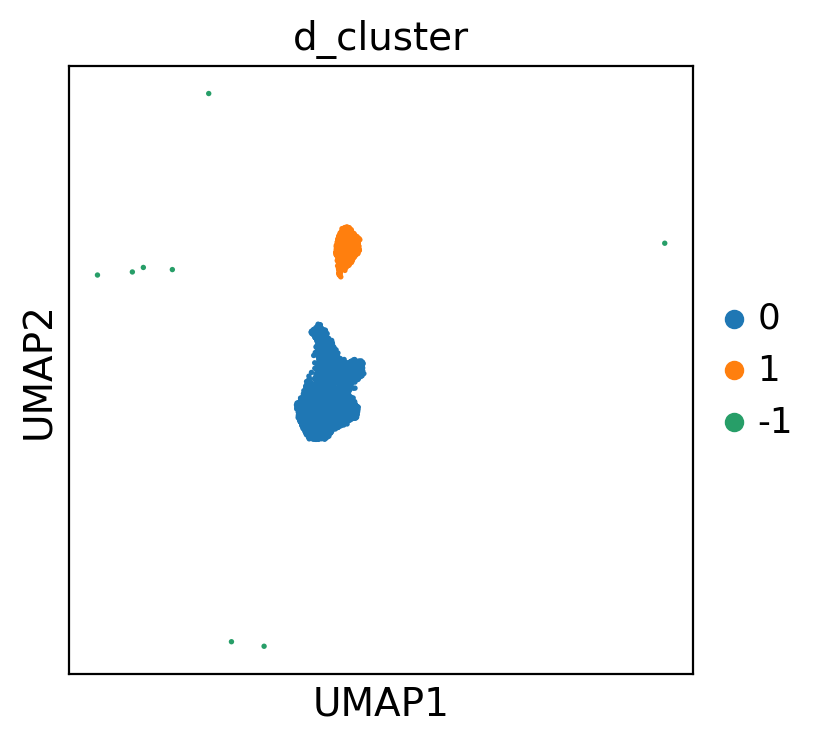

In [71]:
sc.pl.umap(Endothelium, color = ["d_cluster"], size=15, legend_loc="right margin", wspace=0.7)

In [72]:
Endothelium = Endothelium[Endothelium.obs["d_cluster"].isin(["0","1"])]

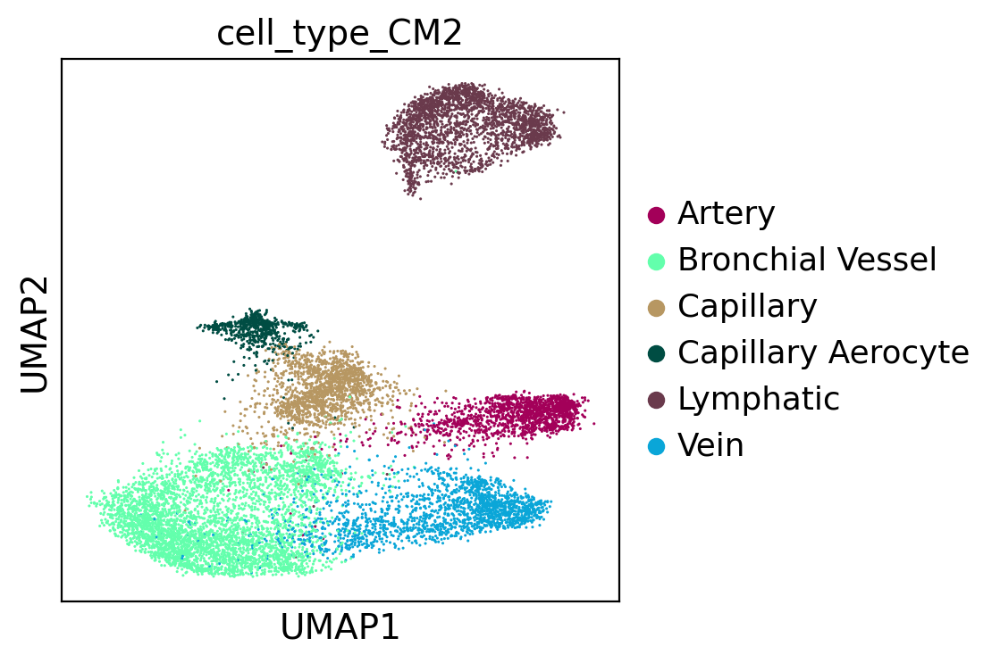

In [74]:
sc.pl.umap(Endothelium,color = ["cell_type_CM2"],legend_loc="right margin",ncols=3, cmap=mymap, size=5, wspace = 0.45,save="ILDatlas_Endothelium_cell_type_CM2.pdf")

ranking genes
    finished (0:00:40)


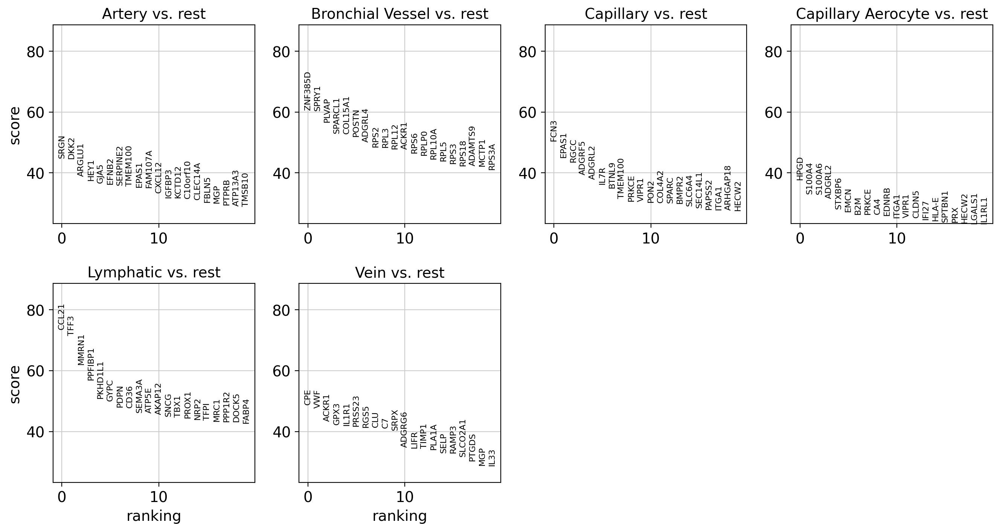

In [302]:
## All Markers
sc.tl.rank_genes_groups(Endothelium, groupby = 'cell_type_CM2', groups = "all", use_raw = False, method = "wilcoxon",n_genes=1000, pts= True)
sc.pl.rank_genes_groups(Endothelium)

In [303]:
## Combine into one Data Frame (comparable to Marker Table)
result = Endothelium.uns['rank_genes_groups']
allMarkers_Endothelium = []
for cluster in result['names'].dtype.names:
    current = pd.DataFrame({"gene": result["names"][cluster], "score": result["scores"][cluster],
                            "logfoldchange": result["logfoldchanges"][cluster], "pval": result["pvals"][cluster],
                            "pval_adj": result["pvals_adj"][cluster],
                            "pct_within":result["pts"].loc[result["names"][cluster]][cluster],
                            "pct_outside":result["pts_rest"].loc[result["names"][cluster]][cluster],  "cluster": cluster})
    allMarkers_Endothelium.append(current)
allMarkers_Endothelium = pd.concat(allMarkers_Endothelium)
allMarkers_Endothelium.head()

,gene,score,logfoldchange,pval,pval_adj,pct_within,pct_outside,cluster
SRGN,SRGN,44.856113,2.983932,0.000000e+00,0.000000e+00,0.956270,0.697034,Artery
DKK2,DKK2,44.775471,8.685607,0.000000e+00,0.000000e+00,0.708682,0.013120,Artery
ARGLU1,ARGLU1,38.908112,2.777113,0.000000e+00,0.000000e+00,0.880386,0.593458,Artery
HEY1,HEY1,37.545471,4.997319,1.670137e-308,1.279617e-304,0.657235,0.096554,Artery
GJA5,GJA5,36.685543,5.461467,1.241883e-294,7.611996e-291,0.623151,0.058209,Artery


In [304]:
## Write to file 
allMarkers_Endothelium.to_csv("./AllMarkers_ILDatlas_Myeloid_1000genes_IPFcontrolatlas.txt", sep = "\t", index = False)

In [437]:
marker3 = allMarkers_Endothelium
marker3 = marker3[marker3['pct_outside'] < 0.10]
marker3 = marker3[marker3['pct_within'] > 0.25]
marker3 = marker3[marker3['logfoldchange'] > 2]
marker3

,gene,score,logfoldchange,pval,pval_adj,pct_within,pct_outside,cluster
DKK2,DKK2,44.775471,8.685607,0.000000e+00,0.000000e+00,0.708682,0.013120,Artery
HEY1,HEY1,37.545471,4.997319,1.670137e-308,1.279617e-304,0.657235,0.096554,Artery
GJA5,GJA5,36.685543,5.461467,1.241883e-294,7.611996e-291,0.623151,0.058209,Artery
SERPINE2,SERPINE2,35.927708,6.050251,1.128463e-282,4.940572e-279,0.592283,0.041855,Artery
IGFBP3,IGFBP3,31.898109,5.858244,2.836151e-223,7.243293e-220,0.536977,0.055715,Artery
...,...,...,...,...,...,...,...,...
CDH11,CDH11,16.612968,3.148196,5.614536e-62,1.890865e-59,0.290441,0.055089,Vein
ALCAM,ALCAM,15.615434,2.710405,5.715540e-55,1.717296e-52,0.295168,0.074661,Vein
TMEM176B,TMEM176B,15.277311,2.813440,1.083176e-52,3.131707e-50,0.279937,0.061867,Vein
C1S,C1S,14.546844,2.532766,6.116055e-48,1.673560e-45,0.279412,0.075138,Vein


In [438]:
marker3.sort_values(by = ["cluster", "logfoldchange"], ascending = [True, False], inplace = True)

In [439]:
#Get ordering as in Dendrogram
sc.tl.dendrogram(Endothelium, groupby = "cell_type_CM2",use_rep="X_scVI")
order = Endothelium.uns["dendrogram_cell_type_CM2"]["dendrogram_info"]["ivl"]

Storing dendrogram info using `.uns['dendrogram_cell_type_CM2']`


In [440]:
#Get top genes from Markers Table
n_genes = 3
genes = []
for typ in order:
    curgenes = marker3.loc[marker3.cluster == typ, "gene"].values[0:n_genes]
    genes = genes + [g for g in curgenes if g not in genes]

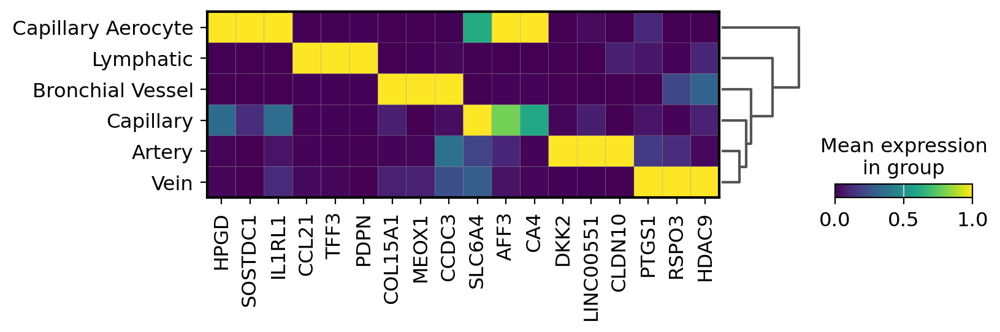

In [441]:
sc.pl.matrixplot(Endothelium, var_names = genes, standard_scale = "var", groupby = "cell_type_CM2", dendrogram = True,figsize=(8,2),
                save = "_top%s_per_celltype_Endothelium.pdf" %n_genes)

### Epithelium

In [58]:
adata.obs["compartment"].cat.categories

Index(['Endothelium', 'Epithelium', 'Lymphoid', 'Mesenchyme', 'Myeloid'], dtype='object')

In [76]:
Epithelium = adata[(adata.obs["compartment"] == "Epithelium")]
Epithelium

View of AnnData object with n_obs × n_vars = 49589 × 30647
    obs: 'sampleID', 'study', 'diagnosis', 'Disease_study', 'compartment', 'cell type', 'cell subtype', 'n_genes', 'log1p_n_genes_by_counts', 'total_counts', 'pct_counts_mitochondrial', 'Source', 'n_genes_by_counts', 'log1p_total_counts', 'total_counts_mitochondrial', 'log1p_total_counts_mitochondrial', 'cell_type_CM', 'cell_type_CM2'
    var: 'gene_ids', 'gene_name', 'mitochondrial', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'cell subtype_colors', 'cell type_colors', 'cell_type_CM2_colors', 'cell_type_CM_colors', 'compartment_colors', 'diagnosis_colors', 'neighbors', 'study_colors', 'umap', 'Disease_study_colors'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts', 'log1p'
    obsp: 'connectivities', 'distances'

In [77]:
Epithelium.obs["d_cluster"] = tidy_up(Epithelium.obsm["X_umap"], min_samples = 10)

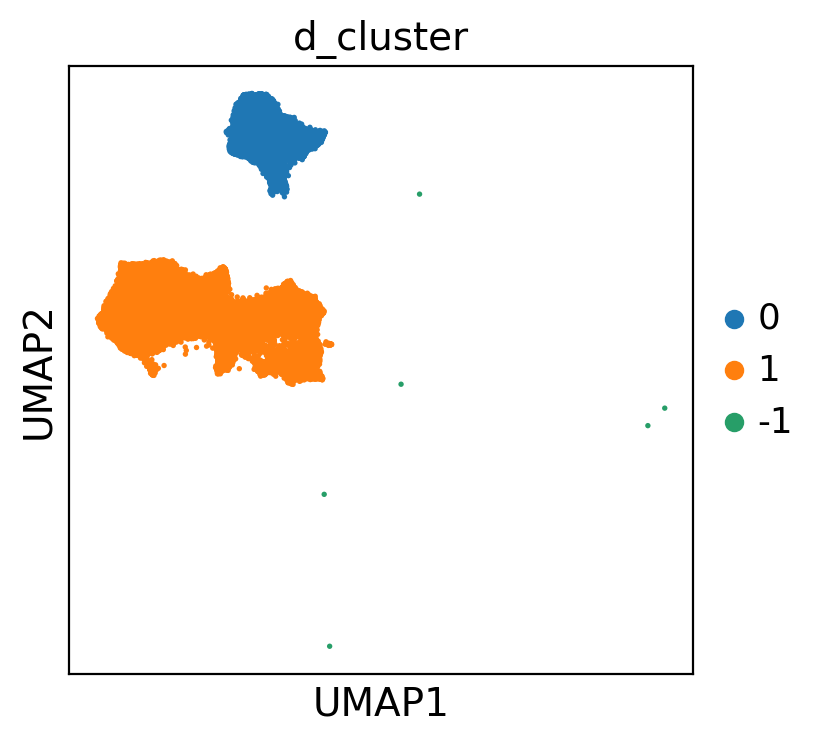

In [78]:
sc.pl.umap(Epithelium, color = ["d_cluster"], size=15, legend_loc="right margin", wspace=0.7)

In [79]:
Epithelium = Epithelium[Epithelium.obs["d_cluster"].isin(["0","1"])]

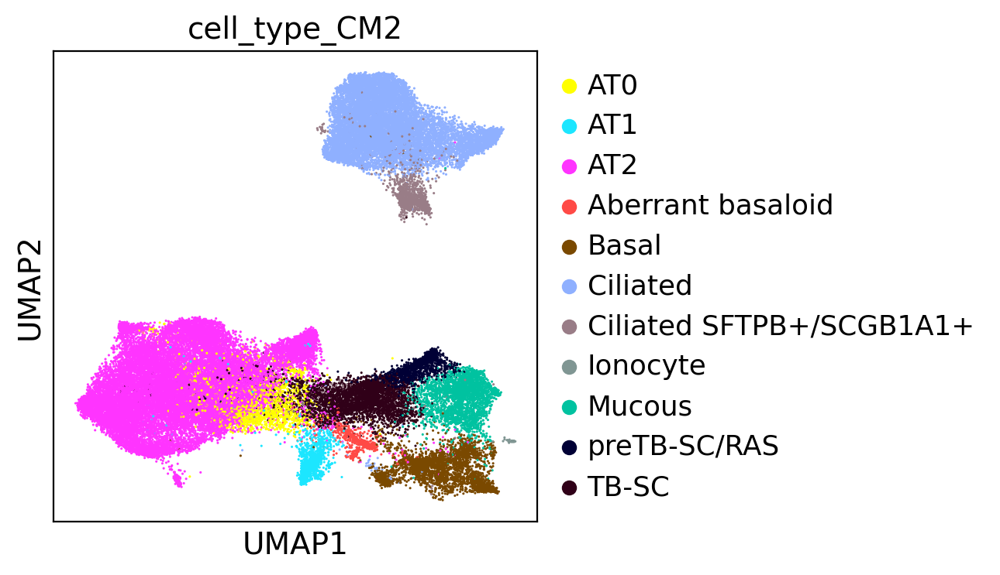

In [80]:
sc.pl.umap(Epithelium,color = ["cell_type_CM2"],legend_loc="right margin",ncols=3, cmap=mymap, size=5, wspace = 0.45,save="ILDatlas_Epithelium_cell_type_CM2.pdf")

ranking genes
    finished (0:03:30)


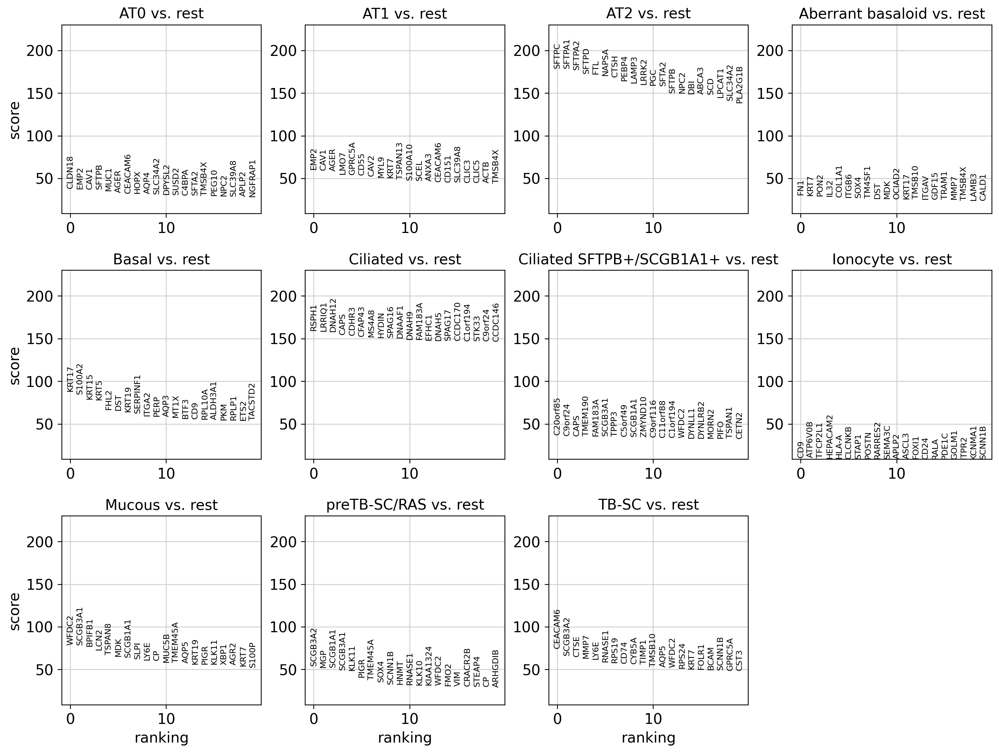

In [293]:
## All Markers
sc.tl.rank_genes_groups(Epithelium, groupby = 'cell_type_CM2', groups = "all", use_raw = False, method = "wilcoxon",n_genes=1000, pts= True)
sc.pl.rank_genes_groups(Epithelium)

In [294]:
## Combine into one Data Frame (comparable to Marker Table)
result = Epithelium.uns['rank_genes_groups']
allMarkers_Epithelium = []
for cluster in result['names'].dtype.names:
    current = pd.DataFrame({"gene": result["names"][cluster], "score": result["scores"][cluster],
                            "logfoldchange": result["logfoldchanges"][cluster], "pval": result["pvals"][cluster],
                            "pval_adj": result["pvals_adj"][cluster],
                            "pct_within":result["pts"].loc[result["names"][cluster]][cluster],
                            "pct_outside":result["pts_rest"].loc[result["names"][cluster]][cluster],  "cluster": cluster})
    allMarkers_Epithelium.append(current)
allMarkers_Epithelium = pd.concat(allMarkers_Epithelium)
allMarkers_Epithelium.head()

,gene,score,logfoldchange,pval,pval_adj,pct_within,pct_outside,cluster
CLDN18,CLDN18,38.163513,3.221834,0.000000e+00,0.000000e+00,0.870405,0.430468,AT0
EMP2,EMP2,37.821903,2.019502,0.000000e+00,0.000000e+00,0.934579,0.772854,AT0
CAV1,CAV1,37.140396,3.538718,6.265023e-302,6.400138e-298,0.752648,0.300013,AT0
SFTPB,SFTPB,37.125305,3.772347,1.097618e-301,8.409674e-298,1.000000,0.719309,AT0
MUC1,MUC1,35.403145,2.214067,1.527487e-274,9.362579e-271,0.952648,0.732753,AT0


In [295]:
## Write to file 
allMarkers_Epithelium.to_csv("./AllMarkers_ILDatlas_Epithelium_1000genes_IPFcontrolatlas.txt", sep = "\t", index = False)

In [432]:
marker3 = allMarkers_Epithelium
marker3 = marker3[marker3['pct_outside'] < 0.15]
marker3 = marker3[marker3['pct_within'] > 0.35]
marker3 = marker3[marker3['logfoldchange'] > 2]
marker3

,gene,score,logfoldchange,pval,pval_adj,pct_within,pct_outside,cluster
SCEL,SCEL,19.909014,2.726967,3.399458e-88,1.335682e-85,0.385047,0.095669,AT0
SCEL,SCEL,47.400303,6.323596,0.000000e+00,0.000000e+00,0.776664,0.085564,AT1
CLIC5,CLIC5,45.289913,5.696958,0.000000e+00,0.000000e+00,0.758769,0.114535,AT1
SPOCK2,SPOCK2,44.011322,8.354083,0.000000e+00,0.000000e+00,0.697924,0.017889,AT1
TIMP3,TIMP3,43.989296,6.617665,0.000000e+00,0.000000e+00,0.720115,0.069585,AT1
...,...,...,...,...,...,...,...,...
FMO2,FMO2,40.435913,3.330177,0.000000e+00,0.000000e+00,0.525014,0.138500,TB-SC
MGP,MGP,28.468121,3.002638,2.907741e-178,6.504639e-176,0.393690,0.120916,TB-SC
KLK11,KLK11,28.371870,2.384578,4.497973e-177,9.846385e-175,0.429505,0.140866,TB-SC
TMEM45A,TMEM45A,24.489325,2.476181,1.919483e-132,2.748898e-130,0.351336,0.108586,TB-SC


In [433]:
marker3.sort_values(by = ["cluster", "logfoldchange"], ascending = [True, False], inplace = True)

In [434]:
#Get ordering as in Dendrogram
sc.tl.dendrogram(Epithelium, groupby = "cell_type_CM2",use_rep="X_scVI")
order = Epithelium.uns["dendrogram_cell_type_CM2"]["dendrogram_info"]["ivl"]

Storing dendrogram info using `.uns['dendrogram_cell_type_CM2']`


In [435]:
#Get top genes from Markers Table
n_genes = 3
genes = []
for typ in order:
    curgenes = marker3.loc[marker3.cluster == typ, "gene"].values[0:n_genes]
    genes = genes + [g for g in curgenes if g not in genes]

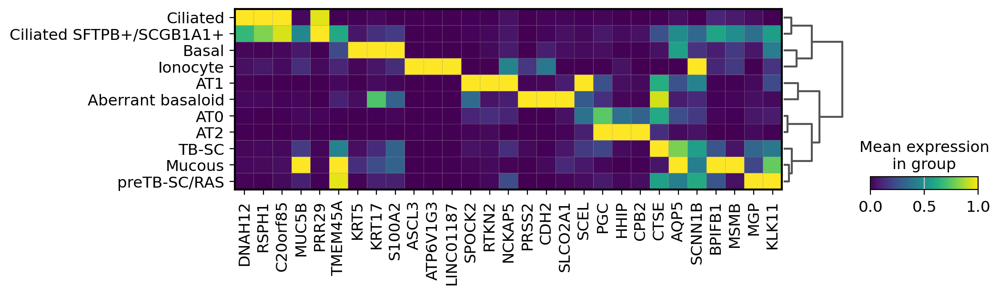

In [436]:
sc.pl.matrixplot(Epithelium, var_names = genes, standard_scale = "var", groupby = "cell_type_CM2", dendrogram = True,figsize=(10,2.5),
                save = "_top%s_per_celltype_Epithelium.pdf" %n_genes)

### Mesenchyme

In [301]:
adata.obs["compartment"].cat.categories

Index(['Endothelium', 'Epithelium', 'Lymphoid', 'Mesenchyme', 'Myeloid'], dtype='object')

In [178]:
Mesenchyme = adata[(adata.obs["compartment"] == "Mesenchyme")]
Mesenchyme

View of AnnData object with n_obs × n_vars = 16655 × 30647
    obs: 'sampleID', 'study', 'diagnosis', 'Disease_study', 'compartment', 'cell type', 'cell subtype', 'n_genes', 'log1p_n_genes_by_counts', 'total_counts', 'pct_counts_mitochondrial', 'Source', 'n_genes_by_counts', 'log1p_total_counts', 'total_counts_mitochondrial', 'log1p_total_counts_mitochondrial', 'cell_type_CM', 'cell_type_CM2'
    var: 'gene_ids', 'gene_name', 'mitochondrial', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'cell subtype_colors', 'cell type_colors', 'cell_type_CM2_colors', 'cell_type_CM_colors', 'compartment_colors', 'diagnosis_colors', 'neighbors', 'study_colors', 'umap', 'Disease_study_colors'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts', 'log1p'
    obsp: 'connectivities', 'distances'

In [179]:
Mesenchyme.obs["d_cluster"] = tidy_up(Mesenchyme.obsm["X_umap"], min_samples = 10)

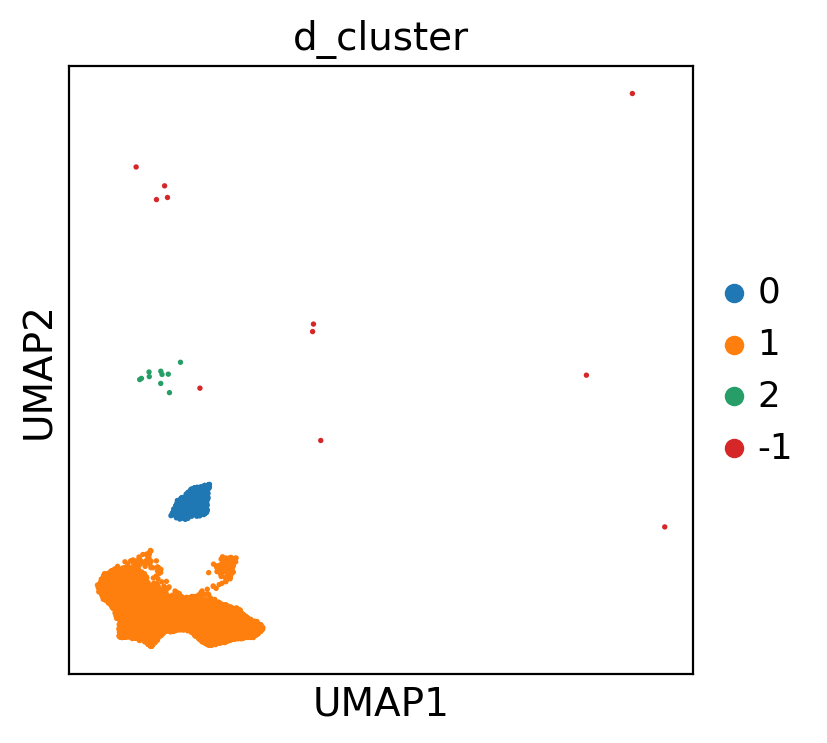

In [180]:
sc.pl.umap(Mesenchyme, color = ["d_cluster"], size=15, legend_loc="right margin", wspace=0.7)

In [181]:
Mesenchyme = Mesenchyme[Mesenchyme.obs["d_cluster"].isin(["0","1"])]

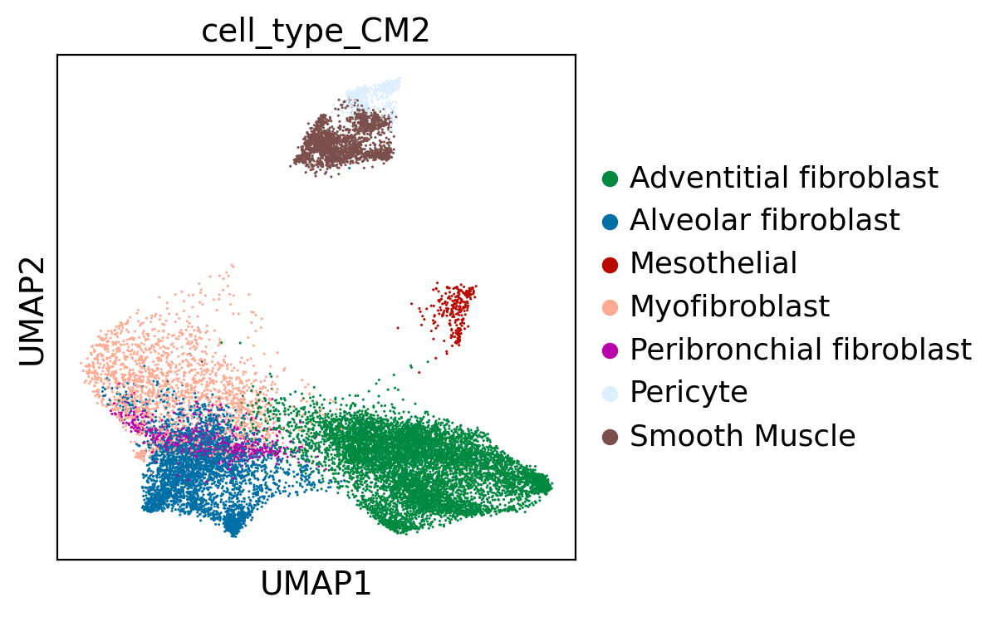

In [182]:
sc.pl.umap(Mesenchyme,color = ["cell_type_CM2"],legend_loc="right margin",ncols=3, cmap=mymap, size=5, wspace = 0.45,save="ILDatlas_Mesenchyme_cell_type_CM2.pdf")

ranking genes
    finished (0:01:12)


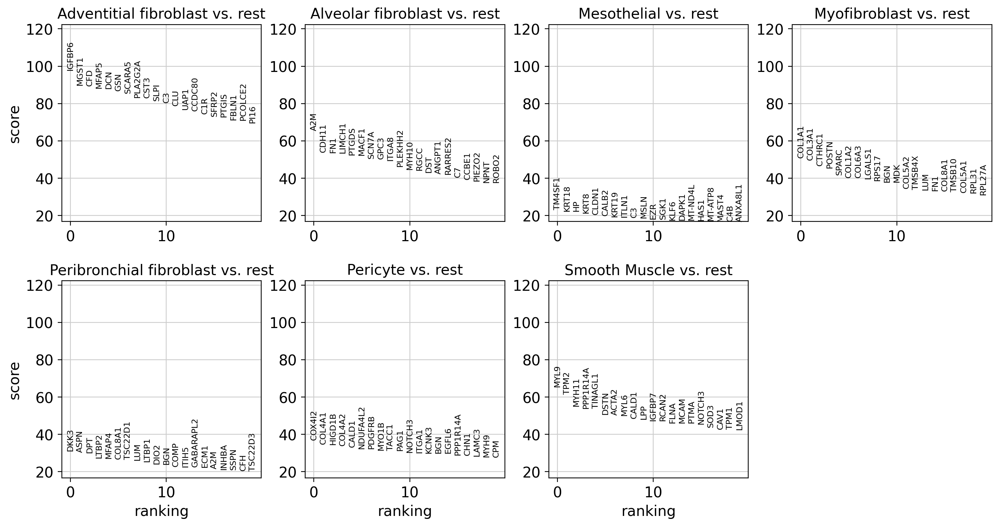

In [285]:
## All Markers
sc.tl.rank_genes_groups(Mesenchyme, groupby = 'cell_type_CM2', groups = "all", use_raw = False, method = "wilcoxon",n_genes=1000, pts= True)
sc.pl.rank_genes_groups(Mesenchyme)

In [286]:
## Combine into one Data Frame (comparable to Marker Table)
result = Mesenchyme.uns['rank_genes_groups']
allMarkers_Mesenchyme = []
for cluster in result['names'].dtype.names:
    current = pd.DataFrame({"gene": result["names"][cluster], "score": result["scores"][cluster],
                            "logfoldchange": result["logfoldchanges"][cluster], "pval": result["pvals"][cluster],
                            "pval_adj": result["pvals_adj"][cluster],
                            "pct_within":result["pts"].loc[result["names"][cluster]][cluster],
                            "pct_outside":result["pts_rest"].loc[result["names"][cluster]][cluster],  "cluster": cluster})
    allMarkers_Mesenchyme.append(current)
allMarkers_Mesenchyme = pd.concat(allMarkers_Mesenchyme)
allMarkers_Mesenchyme.head()

,gene,score,logfoldchange,pval,pval_adj,pct_within,pct_outside,cluster
IGFBP6,IGFBP6,97.975555,5.793974,0.0,0.0,0.964530,0.470023,Adventitial fibroblast
MGST1,MGST1,89.950562,4.941817,0.0,0.0,0.918419,0.291304,Adventitial fibroblast
CFD,CFD,89.442543,5.245748,0.0,0.0,0.959843,0.571968,Adventitial fibroblast
MFAP5,MFAP5,88.308174,7.761978,0.0,0.0,0.821003,0.054462,Adventitial fibroblast
DCN,DCN,88.112236,3.226220,0.0,0.0,0.994680,0.878490,Adventitial fibroblast


In [287]:
## Write to file 
allMarkers_Mesenchyme.to_csv("./AllMarkers_ILDatlas_Mesenchyme_1000genes_IPFcontrolatlas.txt", sep = "\t", index = False)

In [392]:
marker3 = allMarkers_Mesenchyme
marker3 = marker3[marker3['pct_outside'] < 0.15]
marker3 = marker3[marker3['pct_within'] > 0.25]
marker3 = marker3[marker3['logfoldchange'] > 2]
marker3

,gene,score,logfoldchange,pval,pval_adj,pct_within,pct_outside,cluster
MFAP5,MFAP5,88.308174,7.761978,0.000000e+00,0.000000e+00,0.821003,0.054462,Adventitial fibroblast
SCARA5,SCARA5,85.524300,5.639548,0.000000e+00,0.000000e+00,0.840132,0.130435,Adventitial fibroblast
PLA2G2A,PLA2G2A,83.242508,6.748919,0.000000e+00,0.000000e+00,0.821510,0.139359,Adventitial fibroblast
SLPI,SLPI,81.489891,6.255140,0.000000e+00,0.000000e+00,0.796681,0.130320,Adventitial fibroblast
PCOLCE2,PCOLCE2,71.141144,5.731184,0.000000e+00,0.000000e+00,0.680770,0.055721,Adventitial fibroblast
...,...,...,...,...,...,...,...,...
FABP5,FABP5,12.938751,2.318876,2.720141e-38,7.769261e-37,0.250125,0.079647,Smooth Muscle
NES,NES,12.756751,2.009895,2.858764e-37,7.921567e-36,0.269058,0.103576,Smooth Muscle
ATP10A,ATP10A,12.355814,2.023820,4.531484e-35,1.199278e-33,0.263079,0.098722,Smooth Muscle
KIAA0922,KIAA0922,12.304758,2.003972,8.539210e-35,2.234852e-33,0.268560,0.113284,Smooth Muscle


In [393]:
marker3.sort_values(by = ["cluster", "logfoldchange"], ascending = [True, False], inplace = True)

In [394]:
#Get ordering as in Dendrogram
sc.tl.dendrogram(Mesenchyme, groupby = "cell_type_CM2",use_rep="X_scVI")
order = Mesenchyme.uns["dendrogram_cell_type_CM2"]["dendrogram_info"]["ivl"]

Storing dendrogram info using `.uns['dendrogram_cell_type_CM2']`


In [395]:
#Get top genes from Markers Table
n_genes = 3
genes = []
for typ in order:
    curgenes = marker3.loc[marker3.cluster == typ, "gene"].values[0:n_genes]
    genes = genes + [g for g in curgenes if g not in genes]

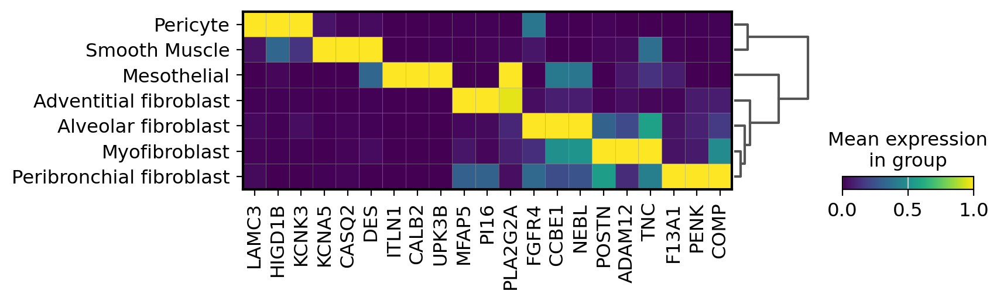

In [397]:
sc.pl.matrixplot(Mesenchyme, var_names = genes, standard_scale = "var", groupby = "cell_type_CM2", dendrogram = True,figsize=(8,2),
                save = "_top%s_per_celltype_Mesenchyme.pdf" %n_genes)

### Lymphoid

In [191]:
adata.obs["compartment"].cat.categories

Index(['Endothelium', 'Epithelium', 'Lymphoid', 'Mesenchyme', 'Myeloid'], dtype='object')

In [192]:
Lymphoid = adata[(adata.obs["compartment"] == "Lymphoid")]
Lymphoid

View of AnnData object with n_obs × n_vars = 36076 × 30647
    obs: 'sampleID', 'study', 'diagnosis', 'Disease_study', 'compartment', 'cell type', 'cell subtype', 'n_genes', 'log1p_n_genes_by_counts', 'total_counts', 'pct_counts_mitochondrial', 'Source', 'n_genes_by_counts', 'log1p_total_counts', 'total_counts_mitochondrial', 'log1p_total_counts_mitochondrial', 'cell_type_CM', 'cell_type_CM2'
    var: 'gene_ids', 'gene_name', 'mitochondrial', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'cell subtype_colors', 'cell type_colors', 'cell_type_CM2_colors', 'cell_type_CM_colors', 'compartment_colors', 'diagnosis_colors', 'neighbors', 'study_colors', 'umap', 'Disease_study_colors'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts', 'log1p'
    obsp: 'connectivities', 'distances'

In [193]:
Lymphoid.obs["d_cluster"] = tidy_up(Lymphoid.obsm["X_umap"], min_samples = 10)

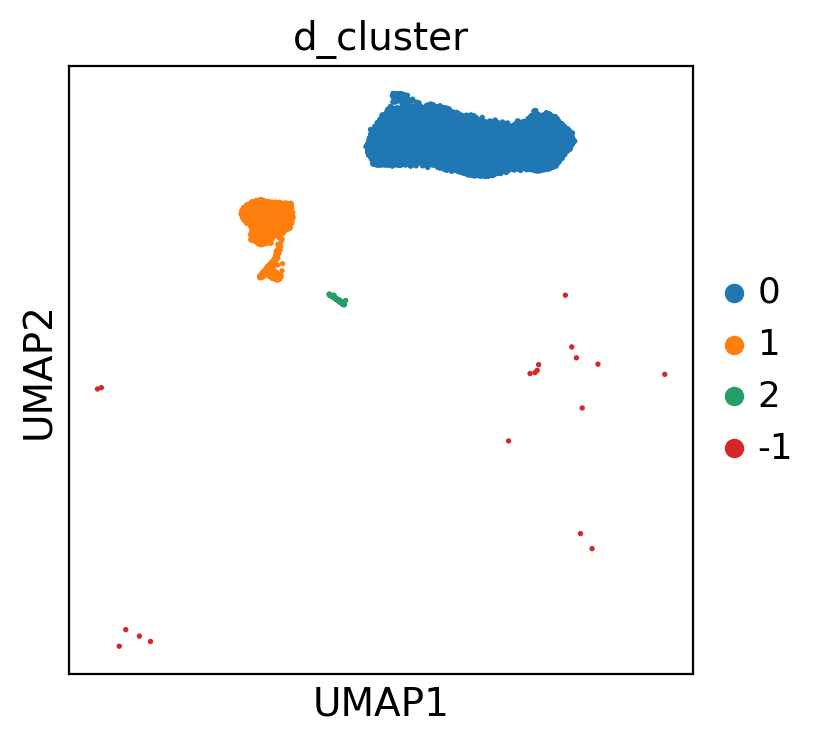

In [194]:
sc.pl.umap(Lymphoid, color = ["d_cluster"], size=15, legend_loc="right margin", wspace=0.7)

In [195]:
Lymphoid = Lymphoid[Lymphoid.obs["d_cluster"].isin(["0","1","2"])]

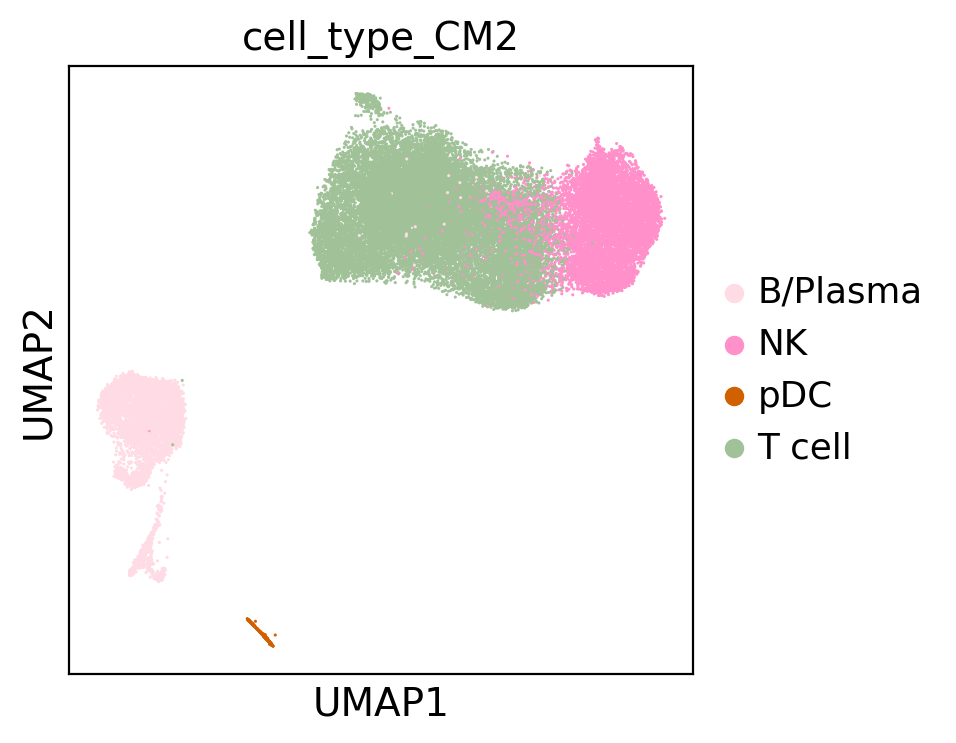

In [196]:
sc.pl.umap(Lymphoid,color = ["cell_type_CM2"],legend_loc="right margin",ncols=3, cmap=mymap, size=5, wspace = 0.45,save="ILDatlas_Lymphoid_cell_type_CM2.pdf")

ranking genes
    finished (0:01:59)


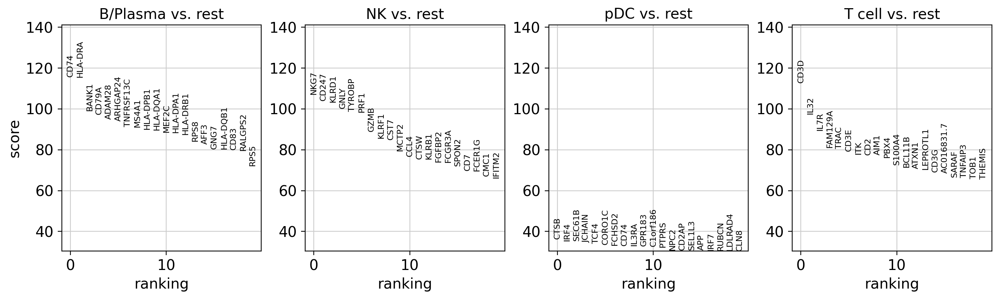

In [249]:
## All Markers
sc.tl.rank_genes_groups(Lymphoid, groupby = 'cell_type_CM2', groups = "all", use_raw = False, method = "wilcoxon",n_genes=1000, pts= True)
sc.pl.rank_genes_groups(Lymphoid)

In [250]:
## Combine into one Data Frame (comparable to Marker Table)
result = Lymphoid.uns['rank_genes_groups']
allMarkers_Lymphoid = []
for cluster in result['names'].dtype.names:
    current = pd.DataFrame({"gene": result["names"][cluster], "score": result["scores"][cluster],
                            "logfoldchange": result["logfoldchanges"][cluster], "pval": result["pvals"][cluster],
                            "pval_adj": result["pvals_adj"][cluster],
                            "pct_within":result["pts"].loc[result["names"][cluster]][cluster],
                            "pct_outside":result["pts_rest"].loc[result["names"][cluster]][cluster],  "cluster": cluster})
    allMarkers_Lymphoid.append(current)
allMarkers_Lymphoid = pd.concat(allMarkers_Lymphoid)
allMarkers_Lymphoid.head()

,gene,score,logfoldchange,pval,pval_adj,pct_within,pct_outside,cluster
CD74,CD74,115.653297,4.833717,0.0,0.0,0.988631,0.637142,B/Plasma
HLA-DRA,HLA-DRA,115.420662,6.023478,0.0,0.0,0.960647,0.376490,B/Plasma
BANK1,BANK1,99.146332,8.421166,0.0,0.0,0.778458,0.022400,B/Plasma
CD79A,CD79A,97.319565,9.815462,0.0,0.0,0.757616,0.007090,B/Plasma
ADAM28,ADAM28,94.926018,8.098285,0.0,0.0,0.750619,0.023051,B/Plasma


In [409]:
## Write to file 
allMarkers_Lymphoid.to_csv("./AllMarkers_ILDatlas_Lymphoid_1000genes_IPFcontrolatlas.txt", sep = "\t", index = False)

In [410]:
marker3 = allMarkers_Lymphoid
marker3 = marker3[marker3['pct_outside'] < 0.1]
marker3 = marker3[marker3['pct_within'] > 0.25]
marker3 = marker3[marker3['logfoldchange'] > 2]
marker3

,gene,score,logfoldchange,pval,pval_adj,pct_within,pct_outside,cluster
BANK1,BANK1,99.146332,8.421166,0.000000e+00,0.000000e+00,0.778458,0.022400,B/Plasma
CD79A,CD79A,97.319565,9.815462,0.000000e+00,0.000000e+00,0.757616,0.007090,B/Plasma
ADAM28,ADAM28,94.926018,8.098285,0.000000e+00,0.000000e+00,0.750619,0.023051,B/Plasma
ARHGAP24,ARHGAP24,93.943108,8.033998,0.000000e+00,0.000000e+00,0.742749,0.026853,B/Plasma
TNFRSF13C,TNFRSF13C,91.303413,8.268517,0.000000e+00,0.000000e+00,0.718263,0.017194,B/Plasma
...,...,...,...,...,...,...,...,...
ZNF831,ZNF831,35.383919,2.424084,3.018133e-274,7.007327e-272,0.308224,0.095814,T cell
RUNX2,RUNX2,33.669075,2.645667,1.639727e-248,3.284492e-246,0.277327,0.075824,T cell
ITM2A,ITM2A,33.091259,2.329507,3.969734e-240,7.463830e-238,0.291358,0.094435,T cell
SERINC5,SERINC5,31.327553,2.357621,1.967394e-215,3.224318e-213,0.274342,0.089109,T cell


In [411]:
marker3 = marker3[~marker3.index.str.startswith("RP")]

In [412]:
marker3.sort_values(by = ["cluster", "logfoldchange"], ascending = [True, False], inplace = True)

In [413]:
#Get ordering as in Dendrogram
sc.tl.dendrogram(Lymphoid, groupby = "cell_type_CM2",use_rep="X_scVI")
order = Lymphoid.uns["dendrogram_cell_type_CM2"]["dendrogram_info"]["ivl"]

Storing dendrogram info using `.uns['dendrogram_cell_type_CM2']`


In [414]:
#Get top genes from Markers Table
n_genes = 3
genes = []
for typ in order:
    curgenes = marker3.loc[marker3.cluster == typ, "gene"].values[0:n_genes]
    genes = genes + [g for g in curgenes if g not in genes]

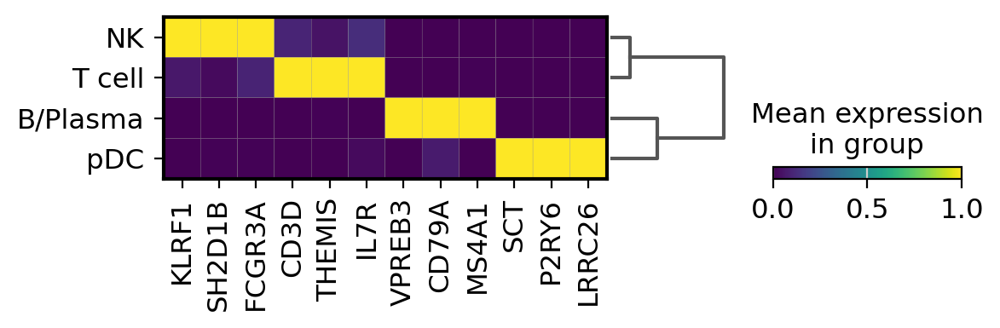

In [415]:
sc.pl.matrixplot(Lymphoid, var_names = genes, standard_scale = "var", groupby = "cell_type_CM2", dendrogram = True,figsize=(6,1.25),
                save = "_top%s_per_celltype_Lymphoid.pdf" %n_genes)

### Myeloid

In [204]:
adata.obs["compartment"].cat.categories

Index(['Endothelium', 'Epithelium', 'Lymphoid', 'Mesenchyme', 'Myeloid'], dtype='object')

In [205]:
Myeloid = adata[(adata.obs["compartment"] == "Myeloid")]
Myeloid

View of AnnData object with n_obs × n_vars = 92241 × 30647
    obs: 'sampleID', 'study', 'diagnosis', 'Disease_study', 'compartment', 'cell type', 'cell subtype', 'n_genes', 'log1p_n_genes_by_counts', 'total_counts', 'pct_counts_mitochondrial', 'Source', 'n_genes_by_counts', 'log1p_total_counts', 'total_counts_mitochondrial', 'log1p_total_counts_mitochondrial', 'cell_type_CM', 'cell_type_CM2'
    var: 'gene_ids', 'gene_name', 'mitochondrial', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'cell subtype_colors', 'cell type_colors', 'cell_type_CM2_colors', 'cell_type_CM_colors', 'compartment_colors', 'diagnosis_colors', 'neighbors', 'study_colors', 'umap', 'Disease_study_colors'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts', 'log1p'
    obsp: 'connectivities', 'distances'

In [206]:
Myeloid.obs["d_cluster"] = tidy_up(Myeloid.obsm["X_umap"], min_samples = 10)

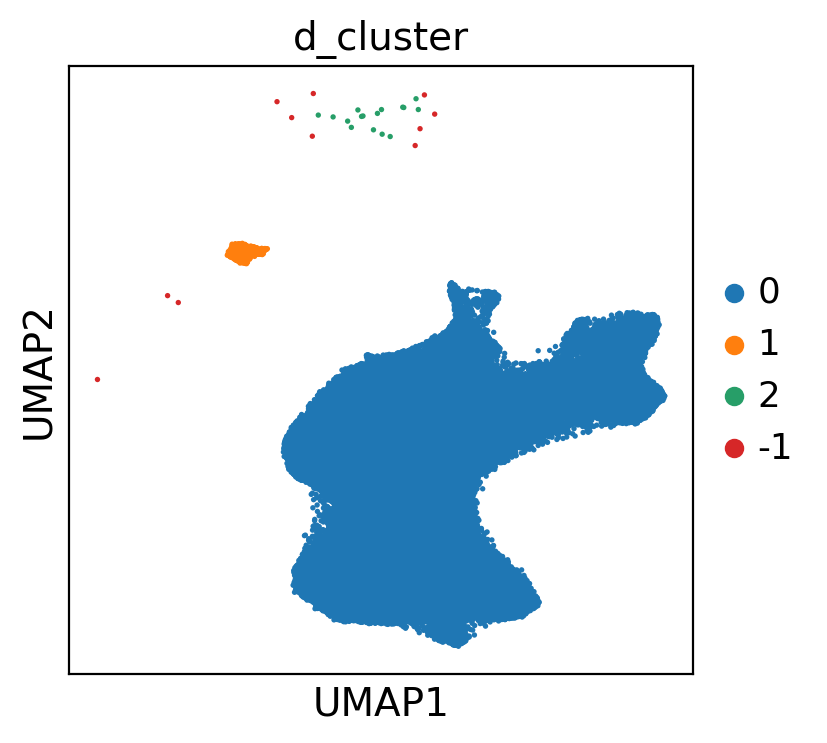

In [207]:
sc.pl.umap(Myeloid, color = ["d_cluster"], size=15, legend_loc="right margin", wspace=0.7)

In [208]:
Myeloid = Myeloid[Myeloid.obs["d_cluster"].isin(["0","1"])]

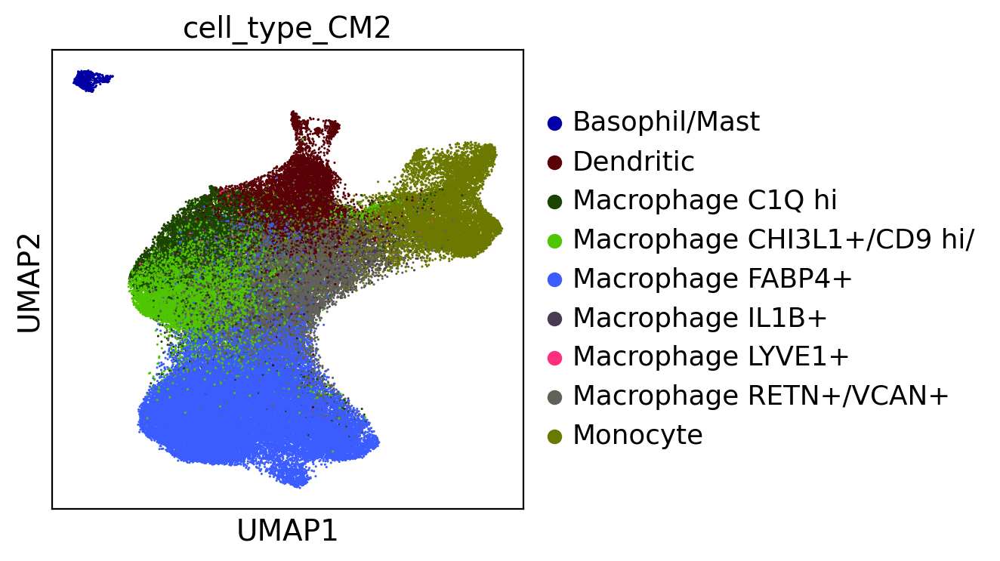

In [209]:
sc.pl.umap(Myeloid,color = ["cell_type_CM2"],legend_loc="right margin",ncols=3, cmap=mymap, size=5, wspace = 0.45,save="ILDatlas_Myeloid_cell_type_CM2.pdf")

ranking genes
    finished (0:07:56)


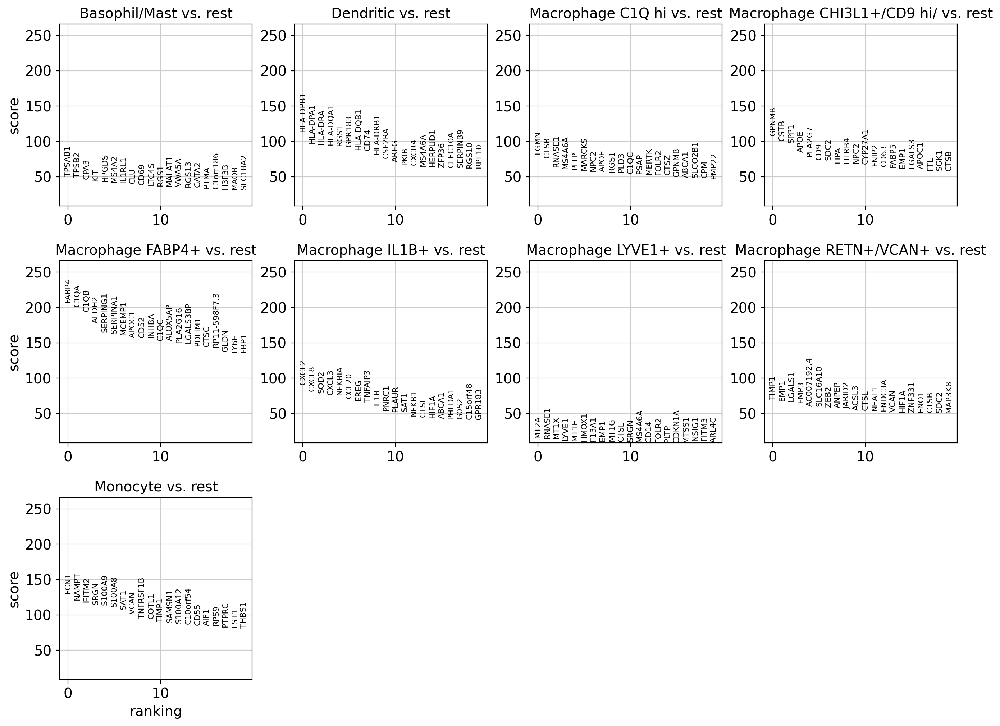

In [240]:
## All Markers
sc.tl.rank_genes_groups(Myeloid, groupby = 'cell_type_CM2', groups = "all", use_raw = False, method = "wilcoxon",n_genes=1000, pts= True)
sc.pl.rank_genes_groups(Myeloid)

In [258]:
## Combine into one Data Frame (comparable to Marker Table)
result = Myeloid.uns['rank_genes_groups']
allMarkers_Myeloid = []
for cluster in result['names'].dtype.names:
    current = pd.DataFrame({"gene": result["names"][cluster], "score": result["scores"][cluster],
                            "logfoldchange": result["logfoldchanges"][cluster], "pval": result["pvals"][cluster],
                            "pval_adj": result["pvals_adj"][cluster],
                            "pct_within":result["pts"].loc[result["names"][cluster]][cluster],
                            "pct_outside":result["pts_rest"].loc[result["names"][cluster]][cluster],  "cluster": cluster})
    allMarkers_Myeloid.append(current)
allMarkers_Myeloid = pd.concat(allMarkers_Myeloid)
allMarkers_Myeloid.head()

,gene,score,logfoldchange,pval,pval_adj,pct_within,pct_outside,cluster
TPSAB1,TPSAB1,49.935738,15.297101,0.0,0.0,0.996450,0.011536,Basophil/Mast
TPSB2,TPSB2,49.146690,14.920271,0.0,0.0,0.981065,0.011185,Basophil/Mast
CPA3,CPA3,46.420822,14.147738,0.0,0.0,0.926627,0.003929,Basophil/Mast
KIT,KIT,43.906258,12.172189,0.0,0.0,0.876923,0.004093,Basophil/Mast
HPGDS,HPGDS,42.932995,7.855953,0.0,0.0,0.871006,0.088039,Basophil/Mast


In [259]:
## Write to file 
allMarkers_Myeloid.to_csv("./AllMarkers_ILDatlas_Myeloid_1000genes_IPFcontrolatlas.txt", sep = "\t", index = False)

In [442]:
marker3 = allMarkers_Myeloid
marker3 = marker3[marker3['pct_outside'] < 0.15]
marker3 = marker3[marker3['pct_within'] > 0.25]
marker3 = marker3[marker3['logfoldchange'] > 2]
marker3

,gene,score,logfoldchange,pval,pval_adj,pct_within,pct_outside,cluster
TPSAB1,TPSAB1,49.935738,15.297101,0.000000e+00,0.000000e+00,0.996450,0.011536,Basophil/Mast
TPSB2,TPSB2,49.146690,14.920271,0.000000e+00,0.000000e+00,0.981065,0.011185,Basophil/Mast
CPA3,CPA3,46.420822,14.147738,0.000000e+00,0.000000e+00,0.926627,0.003929,Basophil/Mast
KIT,KIT,43.906258,12.172189,0.000000e+00,0.000000e+00,0.876923,0.004093,Basophil/Mast
HPGDS,HPGDS,42.932995,7.855953,0.000000e+00,0.000000e+00,0.871006,0.088039,Basophil/Mast
...,...,...,...,...,...,...,...,...
LGALS2,LGALS2,35.758343,2.814000,4.908127e-280,2.700527e-278,0.263906,0.064694,Monocyte
HRH2,HRH2,32.992958,2.347719,1.024856e-238,4.847030e-237,0.263473,0.082073,Monocyte
LILRA2,LILRA2,32.179390,2.009095,3.428636e-227,1.545256e-225,0.285046,0.116980,Monocyte
CDA,CDA,31.713697,2.313710,1.005894e-220,4.341919e-219,0.255762,0.083003,Monocyte


In [443]:
marker3 = marker3[~marker3.index.str.startswith("RP")]

In [444]:
marker3.sort_values(by = ["cluster", "logfoldchange"], ascending = [True, False], inplace = True)

In [445]:
#Get ordering as in Dendrogram
sc.tl.dendrogram(Myeloid, groupby = "cell_type_CM2",use_rep="X_scVI")
order = Myeloid.uns["dendrogram_cell_type_CM2"]["dendrogram_info"]["ivl"]

Storing dendrogram info using `.uns['dendrogram_cell_type_CM2']`


In [446]:
#Get top genes from Markers Table
n_genes = 3
genes = []
for typ in order:
    curgenes = marker3.loc[marker3.cluster == typ, "gene"].values[0:n_genes]
    genes = genes + [g for g in curgenes if g not in genes]

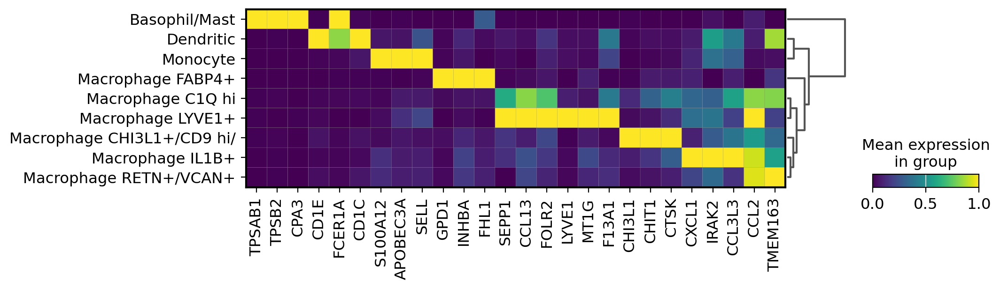

In [447]:
sc.pl.matrixplot(Myeloid, var_names = genes, standard_scale = "var", groupby = "cell_type_CM2", dendrogram = True,figsize=(10,2.5),
                save = "_top%s_per_celltype_Myeloid.pdf" %n_genes)

# whole dataset

ranking genes
    finished (0:43:29)


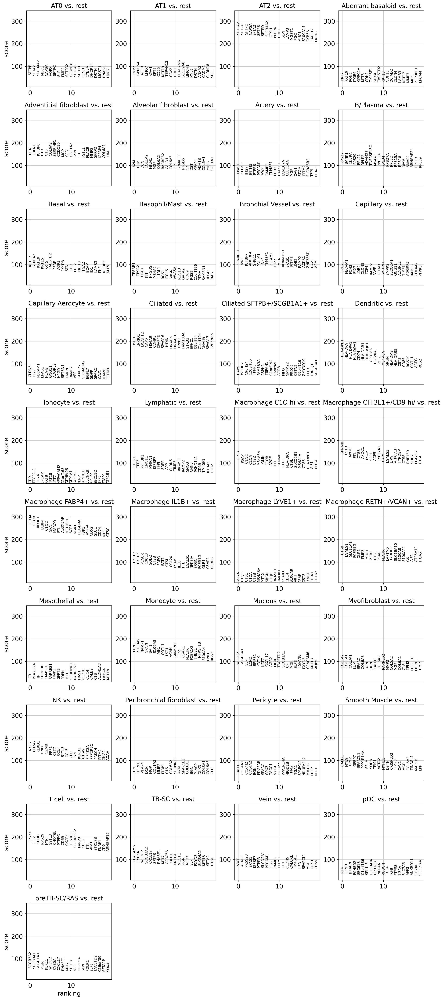

In [23]:
## All Markers
sc.tl.rank_genes_groups(adata, groupby = 'cell_type_CM2', groups = "all", use_raw = False, method = "wilcoxon",n_genes=1000, pts= True)
sc.pl.rank_genes_groups(adata)

In [24]:
## Combine into one Data Frame (comparable to Marker Table)
result = adata.uns['rank_genes_groups']
allMarkers = []
for cluster in result['names'].dtype.names:
    current = pd.DataFrame({"gene": result["names"][cluster], "score": result["scores"][cluster],
                            "logfoldchange": result["logfoldchanges"][cluster], "pval": result["pvals"][cluster],
                            "pval_adj": result["pvals_adj"][cluster],
                            "pct_within":result["pts"].loc[result["names"][cluster]][cluster],
                            "pct_outside":result["pts_rest"].loc[result["names"][cluster]][cluster],  "cluster": cluster})
    allMarkers.append(current)
allMarkers = pd.concat(allMarkers)
allMarkers.head()

,gene,score,logfoldchange,pval,pval_adj,pct_within,pct_outside,cluster
SFTPB,SFTPB,61.750172,9.092051,0.0,0.0,1.000000,0.258057,AT0
SFTA2,SFTA2,59.590881,6.979831,0.0,0.0,0.990654,0.164535,AT0
SLC34A2,SLC34A2,59.399094,6.578034,0.0,0.0,0.980685,0.209061,AT0
MUC1,MUC1,58.769005,6.360149,0.0,0.0,0.952648,0.184332,AT0
NAPSA,NAPSA,58.382145,7.477729,0.0,0.0,0.987539,0.162797,AT0


In [25]:
## Write to file 
allMarkers.to_csv("./AllMarkers_ILDatlas_whole_1000genes_IPFcontrolatlas.txt", sep = "\t", index = False)

In [61]:
marker3 = allMarkers
marker3 = marker3[marker3['pct_outside'] < 0.1]
marker3 = marker3[marker3['pct_within'] > 0.25]
marker3 = marker3[marker3['logfoldchange'] > 2.5]
marker3

,gene,score,logfoldchange,pval,pval_adj,pct_within,pct_outside,cluster
CEACAM6,CEACAM6,49.035973,5.865105,0.000000e+00,0.000000e+00,0.784424,0.098947,AT0
AQP4,AQP4,47.483078,5.289156,0.000000e+00,0.000000e+00,0.753894,0.088365,AT0
SUSD2,SUSD2,47.242672,5.163559,0.000000e+00,0.000000e+00,0.758255,0.099590,AT0
PEG10,PEG10,44.144753,5.362161,0.000000e+00,0.000000e+00,0.706542,0.085151,AT0
AGER,AGER,41.873196,5.561870,0.000000e+00,0.000000e+00,0.650467,0.058960,AT0
...,...,...,...,...,...,...,...,...
HOMER2,HOMER2,13.181096,2.504282,1.127410e-39,4.362593e-38,0.287014,0.064888,preTB-SC/RAS
PCSK1N,PCSK1N,13.029295,2.608160,8.337457e-39,3.162352e-37,0.276261,0.054599,preTB-SC/RAS
PRSS12,PRSS12,12.825866,2.590078,1.174677e-37,4.326963e-36,0.270471,0.051852,preTB-SC/RAS
NT5DC2,NT5DC2,12.219479,2.639112,2.446494e-34,8.377397e-33,0.257237,0.053029,preTB-SC/RAS


In [62]:
marker3 = marker3[~marker3['gene'].str.startswith('RP')]

In [63]:
marker3 = marker3[~marker3['gene'].str.startswith('LINC')]

In [64]:
marker3.sort_values(by = ["cluster", "logfoldchange"], ascending = [True, False], inplace = True)

In [65]:
#Get ordering as in Dendrogram
sc.tl.dendrogram(adata, groupby = "cell_type_CM2",use_rep="X_scVI")
order = adata.uns["dendrogram_cell_type_CM2"]["dendrogram_info"]["ivl"]

Storing dendrogram info using `.uns['dendrogram_cell_type_CM2']`


In [66]:
#Get top genes from Markers Table
n_genes = 2
genes = []
for typ in order:
    curgenes = marker3.loc[marker3.cluster == typ, "gene"].values[0:n_genes]
    genes = genes + [g for g in curgenes if g not in genes]

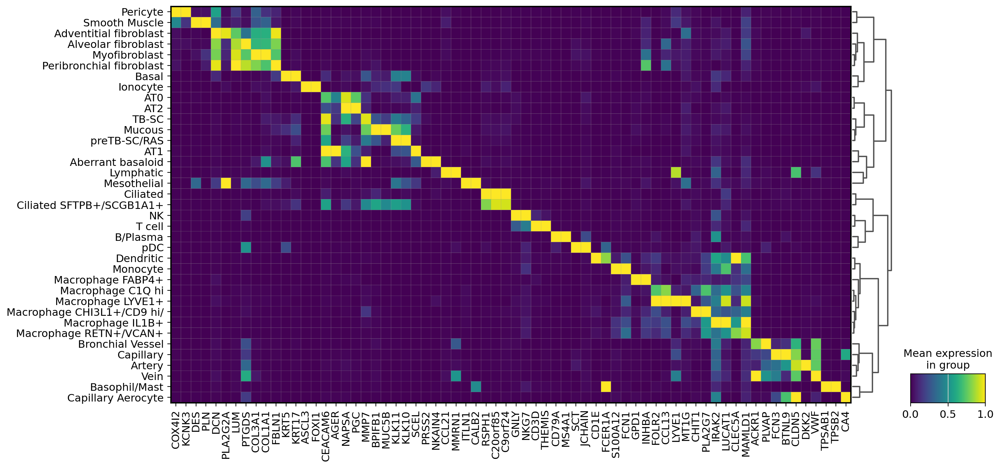

In [68]:
sc.pl.matrixplot(adata, var_names = genes, standard_scale = "var", groupby = "cell_type_CM2", dendrogram = True,figsize=(16,8),
                save = "_top%s_per_celltype_whole_atlas.pdf" %n_genes)

In [253]:
manual_marker_dict = {'Pericyte': ['COX4I2',"KCNK3"],
 'Smooth Muscle': ['DES',"PLN"],
 'Adventitial fibroblast': ['SFRP2',"PI16"],
 'Alveolar fibroblast': ['FGFR4',"LIMCH1"],
 'Myofibroblast': ['CTHRC1',"ASPN"],
 'Peribronchial fibroblast': ["LGR5","WNT5A"],
 'Basal': ['KRT5',"KRT17"],
 'Ionocyte': ['ASCL3',"FOXI1"],
 'AT0': ['PGC',"SFTPC"],
 'AT2': ['NAPSA',"HHIP"],
 'TB-SC': ['MMP7',"SCGB3A2"],
 'Mucous': ["BPIFB1","MUC5B"],
 'preTB-SC/RAS': ["KLK10","KLK11"],
 'AT1': ['AGER',"RTKN2"],
 'Aberrant basaloid': ['CDH2',"PRSS2"],
 'Lymphatic': ['CCL21',"MMRN1"],
 'Mesothelial': ['MSLN',"CALB2"],
 'Ciliated': ['FOXJ1',"RSPH1"],
 'Ciliated SFTPB+/SCGB1A1+': ["SFTPB","SCGB1A1"],
 'NK': ['GNLY',"NKG7"],
 'T cell': ['CD3D',"THEMIS"],
 'B/Plasma': ["CD79A","MS4A1"],
 'pDC': ["SCT","JCHAIN"],
 'Dendritic': ['CD1E',"FCER1A"],
 'Monocyte': ["S100A12","FCN1"],
 'Macrophage FABP4+': ['FABP4',"INHBA"],
 'Macrophage C1Q hi': ['CCL13',"FOLR2"],
 'Macrophage LYVE1+': ['LYVE1',"MT1G"],
 'Macrophage CHI3L1+/CD9 hi/': ['CHI3L1',"CHIT1"],
 'Macrophage IL1B+': ['IRAK2',"LUCAT1"],
 'Macrophage RETN+/VCAN+': ['RETN',"MAMLD1"],
 'Bronchial Vessel': ['PLVAP',"COL15A1"],
 'Capillary': ['FCN3',"BTNL9"],
 'Artery': ['CLDN5',"DKK2"],
 'Vein': ['VWF',"PTGS1"],
 'Basophil/Mast': ['TPSAB1',"TPSB2"],
 'Capillary Aerocyte': ['CA4',"HPGD"]}

In [254]:
manual_marker_list =list(manual_marker_dict.values())
manual_marker_list

[['COX4I2', 'KCNK3'],
 ['DES', 'PLN'],
 ['SFRP2', 'PI16'],
 ['FGFR4', 'LIMCH1'],
 ['CTHRC1', 'ASPN'],
 ['LGR5', 'WNT5A'],
 ['KRT5', 'KRT17'],
 ['ASCL3', 'FOXI1'],
 ['PGC', 'SFTPC'],
 ['NAPSA', 'HHIP'],
 ['MMP7', 'SCGB3A2'],
 ['BPIFB1', 'MUC5B'],
 ['KLK10', 'KLK11'],
 ['AGER', 'RTKN2'],
 ['CDH2', 'PRSS2'],
 ['CCL21', 'MMRN1'],
 ['MSLN', 'CALB2'],
 ['FOXJ1', 'RSPH1'],
 ['SFTPB', 'SCGB1A1'],
 ['GNLY', 'NKG7'],
 ['CD3D', 'THEMIS'],
 ['CD79A', 'MS4A1'],
 ['SCT', 'JCHAIN'],
 ['CD1E', 'FCER1A'],
 ['S100A12', 'FCN1'],
 ['FABP4', 'INHBA'],
 ['CCL13', 'FOLR2'],
 ['LYVE1', 'MT1G'],
 ['CHI3L1', 'CHIT1'],
 ['IRAK2', 'LUCAT1'],
 ['RETN', 'MAMLD1'],
 ['PLVAP', 'COL15A1'],
 ['FCN3', 'BTNL9'],
 ['CLDN5', 'DKK2'],
 ['VWF', 'PTGS1'],
 ['TPSAB1', 'TPSB2'],
 ['CA4', 'HPGD']]

In [255]:
manual_marker_genes = [item for sublist in manual_marker_list for item in sublist]

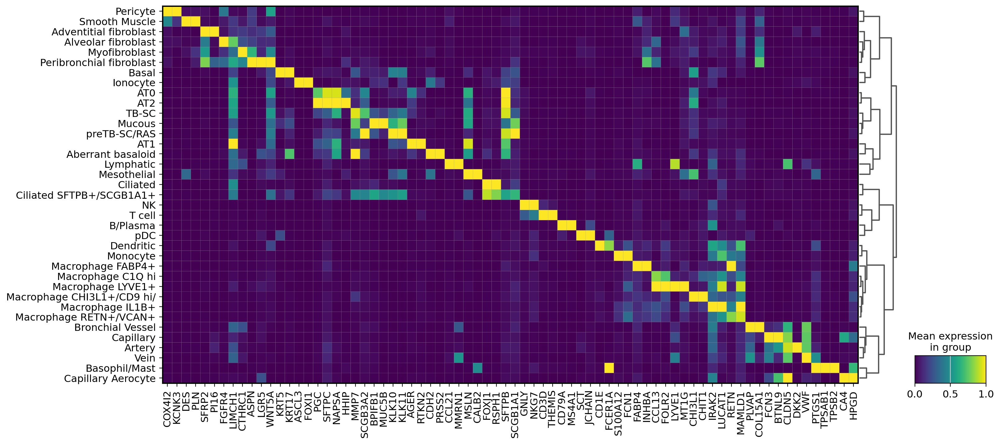

In [256]:
sc.pl.matrixplot(adata, var_names = manual_marker_genes, standard_scale = "var", groupby = "cell_type_CM2", dendrogram = True,figsize=(17,8),
                save = "manualmarkers_per_celltype_whole_atlas.pdf")

# plot genes for figures

## fibrotic Niche

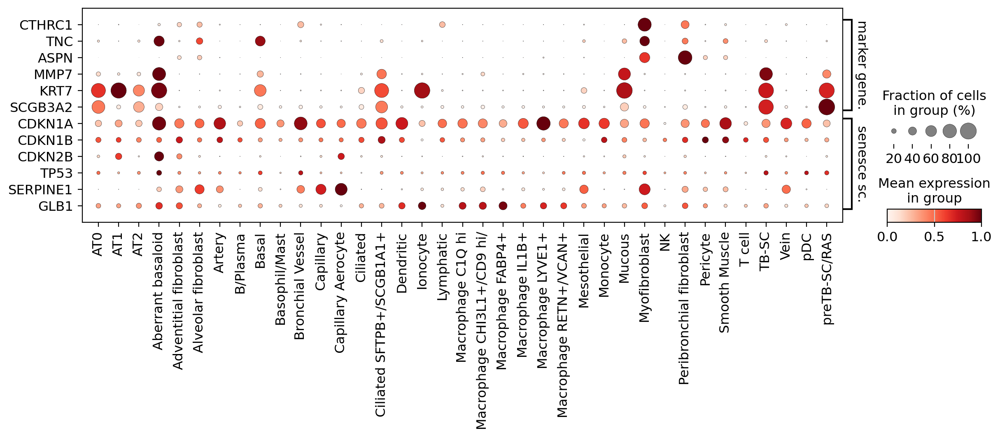

In [49]:
#sc.tl.dendrogram(epi, groupby="leiden_1_cm", use_rep="X_scVI")
#sc.tl.dendrogram(adata, groupby = "cell_type_CM2",use_rep="X_scVI")
sc.pl.dotplot(adata, var_names= ["CTHRC1","TNC","ASPN","MMP7","KRT7","SCGB3A2",                                
"CDKN1A","CDKN1B","CDKN2B","TP53","SERPINE1","GLB1"], standard_scale="var", groupby = ["cell_type_CM2"], cmap=mymap, layer="log1p", dendrogram=False,
         var_group_labels=["marker genes","senesce score genes"], var_group_positions=[(0,5),(6,11)], var_group_rotation= 0,swap_axes=True,figsize=(14,3),
              save="ILD_atlas_marker_genes_celltypeCM2.pdf")

## macrophages

Storing dendrogram info using `.uns['dendrogram_cell_type_CM2']`


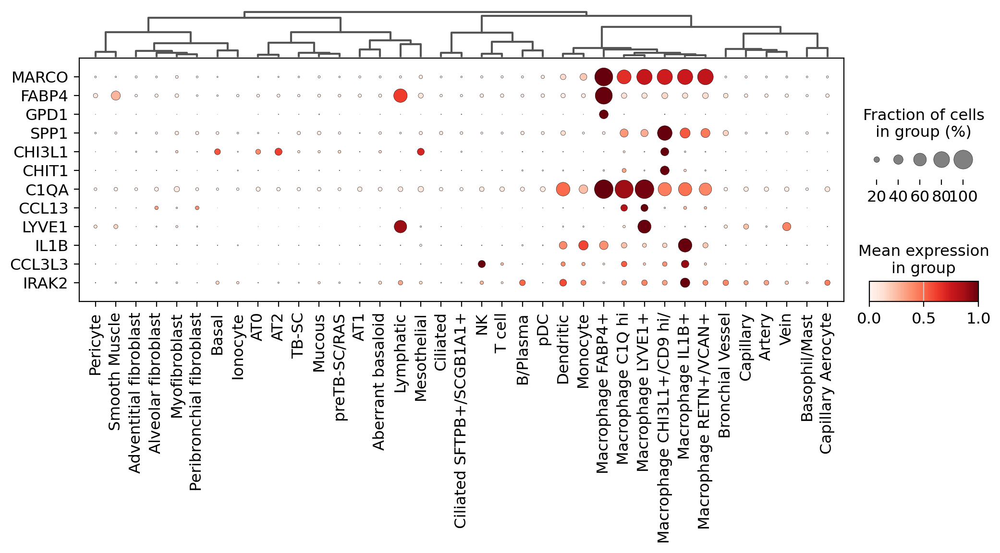

In [84]:
#sc.tl.dendrogram(epi, groupby="leiden_1_cm", use_rep="X_scVI")
sc.tl.dendrogram(adata, groupby = "cell_type_CM2",use_rep="X_scVI")
fig = sc.pl.dotplot(adata, var_names= ["MARCO","FABP4","GPD1",
                                 "SPP1","CHI3L1","CHIT1",
                                 "C1QA","CCL13","LYVE1",
                                 "IL1B","CCL3L3","IRAK2",], standard_scale="var", groupby = ["cell_type_CM2"], cmap=mymap, layer="log1p", dendrogram=True,
         swap_axes=True,figsize=(12,4),
              save="ILD_atlas_marker_genes_Macrophages_celltypeCM2_dendro.pdf")
              #return_fig=True).add_totals()
#fig.savefig(filename="./figures/ILD_atlas_marker_genes_Macrophages_celltypeCM2_totals.pdf")

## Immune Niche

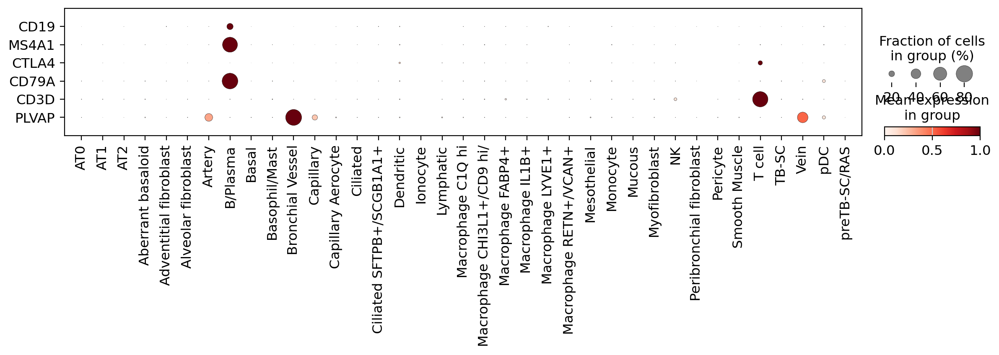

In [24]:
#sc.tl.dendrogram(epi, groupby="leiden_1_cm", use_rep="X_scVI")
#sc.tl.dendrogram(adata, groupby = "cell_type_CM2",use_rep="X_scVI")
sc.pl.dotplot(adata, var_names= ["CD19","MS4A1","CTLA4","CD79A","CD3D","PLVAP"],
              standard_scale="var", groupby = ["cell_type_CM2"], cmap=mymap, layer="log1p", dendrogram=False,
        swap_axes=True,figsize=(14,2),
              save="ILD_atlas_marker_genes_ImmuneNiche_celltypeCM2.pdf")